# Mass spring system in 2-D

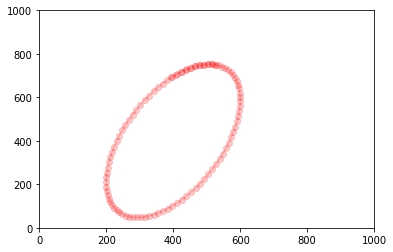

In [40]:
# orbit of a spring mass system 
from math import *
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

x = 200
y = 200
vx = -10
vy = 200

dt = 0.1
fix_x = 400
fix_y = 400
kspring = 5
mass = 10

fig = plt.figure()
ax = plt.axes(xlim=(0, 1000), ylim=(0, 1000))
line, = ax.plot(x, y, "ro-",alpha=0.2)
xtrail = []
ytrail = []

    
def update(x, y):
    global fix_x, fix_y, vx, vy, dt, kspring, mass
    extension =  sqrt((fix_x - x)*(fix_x - x) + (fix_y - y)*(fix_y - y))
    F = kspring * extension
    # find the angle sin(theta) = (y - fix_y) / extension . cos(theta)
    Fx = F * (x - fix_x)/ extension
    Fy = F * (y - fix_y)/ extension
    vx = vx - (Fx / mass)*dt
    vy = vy - (Fy / mass)*dt
    
    x = x + vx * dt
    y = y + vy * dt 
    return x,y 

def animate(i):
    global xtrail,ytrail, x, y, vx, vy
    x, y = update(x,y)
    xtrail.append(x)
    ytrail.append(y)
    start=max((i-100,0))
    line.set_data(xtrail[start:i],ytrail[start:i])
    return line,

anim = animation.FuncAnimation(fig, animate, 
                               frames=300, 
                               interval=20,
                               blit=True)

HTML(anim.to_jshtml())

# Now lets make a chain from masses and springs
### We need to represent bodies and springs
A body should have position, velocity, mass and forces
We need to decide what a spring has as its attribute

In [46]:
bodies = []
springs = []
id = 0
def make_body(x,y,springs=[]):
    global id
    id = id + 1
    body = {
            'id': id,
            'x':x,
            'y':y,
            'vx':0,
            'vy':0,
            'mass': 1,
            'force': {'x':0,'y':0}
    }
    return body
def make_spring(b1, b2, k):
    spring = {'b1':b1,
             'b2':b2,
             'k': k}
    return spring
def make_chain(n, bodies):
    for i in range(n):
        x = i*30
        y = 100
        bodies.append(make_body(x,y))
        
def make_springs(bodies,springs,k):
    for i in range(len(bodies)-1):
        b1 = bodies[i]
        
        b2 = bodies[i+1]
        springs.append(make_spring(b1,b2,k))

        
springk = 1
make_chain(10,bodies)
make_springs(bodies,springs, springk)
#print(bodies)
#print(springs)

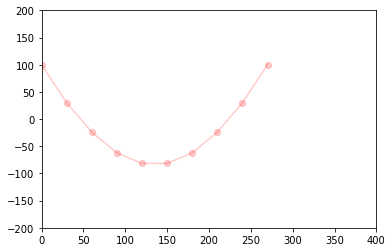

In [47]:
## chain made of spring mass system 
from math import *
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML

chain = []
gravity = -10
fig = plt.figure()
ax = plt.axes(xlim=(0, 400), ylim=(-200, 200))
line, = ax.plot(x, y, "ro-",alpha=0.2)

dt = 0.5

def update_force(b1, b2, k):
    
    force = {}
    # calculate absolute force in spring
    force['x'] = k * sqrt((b1['x'] - b2['x'])*(b1['x'] - b2['x']))
    force['y'] = k * sqrt((b1['y'] - b2['y'])*(b1['y'] - b2['y']))
    #print('force x: {}'.format(force['x']))
    #print('force y: {}'.format(force['y']))
    # now apply to each body noting forces must be equal an opposite on each body
    # however we need the correct sign + or - 
    # if b1_x < b2_x    sign is +
    sign = 1
    if (b1['x'] > b2['x']):
        sign = -1
    b1['force']['x'] = b1['force']['x'] - force['x']*sign
    b2['force']['x'] = b2['force']['x'] + force['x']*sign
    sign = 1
    if (b1['y'] > b2['y']):
        sign = -1
    b1['force']['y'] = b1['force']['y'] + force['y']*sign 
    b2['force']['y'] = b2['force']['y'] - force['y']*sign 

def zero_force(b1, b2, k):
    b1['force']['x'] = 0
    b2['force']['y'] = 0
    
def update_forces(springs):
    for s in springs:
        update_force(s['b1'],s['b2'],s['k'])
    #print('update {}'.format(springs))
    
def zero_forces(springs):
    for s in springs:
        zero_force(s['b1'],s['b2'],s['k'])
    #print('forces zeroed')


def update_position(body):
    global dt
    Fx = body['force']['x']
    Fy = body['force']['y']
    mass = body['mass']
    vx = body['vx']
    vy = body['vy']
    body['vx'] = vx + (Fx / mass)*dt
    body['vy'] = vy + ((Fy +gravity) / mass)*dt
    
    
    body['x'] = body['x'] + body['vx'] * dt
    body['y'] = body['y'] + body['vy'] * dt
    #print('updated id: {}'.format(body))
    return (body['x'],body['y'])

def animate(i):
    chainx = []
    chainy = []
    zero_forces(springs)
    update_forces(springs)
    #print(bodies)
  
    for n in range(1,len(bodies)-1):
        (x,y) = update_position(bodies[n])
    for b in bodies:
        chainx.append(b['x'])
        chainy.append(b['y'])
        
    line.set_data(chainx,chainy)
    return line,


anim = animation.FuncAnimation(fig, animate, 
                               frames=200, 
                               interval=20,
                               blit=True)

HTML(anim.to_jshtml())

# Now add damping
The general equation for dynamics is 
$$m*\ddot{x}+ c*\dot{x} + k * x = f $$
where $c$ is velocity dependent damping 
To make the equations easier we take $c = \alpha * m$ 
This is called mass proportional damping
$$m*\ddot{x}+ \alpha* m *\dot{x} = f - k * x = F $$

$$\ddot{x}+ \alpha*\dot{x} = F/m $$
Now write our difference formula for acceleration and velocity
$$ a_n = (v_{n+1/2} - v_{n-1/2} )/dt $$
and $$v_{n} = (v_{n+1/2} +v_{n-1/2})/2 $$
Put these into 
$$ (v_{n+1/2} - v_{n-1/2} ) + \alpha*dt*(v_{n+1/2} +v_{n-1/2})/2 = F*dt/m $$

Rearrange to get an update for velocity
$$ v_{n+1/2}(1+\alpha*dt/2) =  v_{n-1/2} (1 - \alpha*dt/2) + F*dt/m $$

Finally 
$$ v_{n+1/2} =  R2/R1* v_{n-1/2}  + F*dt/(R1*m) $$
where the following are constants $$R1 = (1+\alpha*dt/2) ;  R2 = (1 - \alpha*dt/2)$$


# Exercise - put daming into the chains 
```python
dt = 0.5
alpha = 0.1
R1 = (1 + alpha*dt/2)
R2 = (1 - alpha*dt/2)
print(R1)
print(R2)
# just change 2 lines of this
def update_position(body):
    global dt
    Fx = body['force']['x']
    Fy = body['force']['y']
    mass = body['mass']
    vx = body['vx']
    vy = body['vy']
    body['vx'] = vx + (Fx / mass)*dt
    body['vy'] = vy + (Fy / mass)*dt
    
    
    body['x'] = body['x'] + body['vx'] * dt
    body['y'] = body['y'] + body['vy'] * dt
    #print('updated id: {}'.format(body))
    return (body['x'],body['y'])
```

1.025
0.975
